*Universidad de Chile*  
*Facultad de Ciencias Físicas y Matemáticas*  
*Departamento de Ingeniería Matemática*

**MA5307-1 Análisis Numérico de EDP: Teoría y Laboratorio**  
**Profesor:** Axel Osses  
**Auxiliares:** Tomás Banduc & Cristóbal Godoy

# **Laboratorio 4 - Mondominio**

**Objetivo General:** Resolver problemas parabólicos multidimensionales mediante el método de Elementos Finitos.

**Objetivo Particular:** A través de FEniCSx, se estudiará la resolución con Elementos Finitos del sistema de mondominio para el modelo iónico de Aliev-Panfilov.

### **Fibrilación Auricular**

La cardiología computacional es un área de desarrollo científico abocada a la investigación de la electrofisiología, hemodinámica y mecánica del corazón mediante modelos *in silico*. Este campo participa de la creación de metodologías para comprender los mecanismos subyacentes a los distintos fenómenos físicos que se manifiestan en el tejido cardíaco, con el fin de predecir anomalías en su funcionamiento, identificar distintas enfermedades y elaborar tratamientos personalizados a la anatomía y antecedentes clínicos de cada paciente.

Un ejemplo de uso de modelos computacionales en el tratamiento de afecciones cardíacas es el de la elaboración de estrategias óptimas de ablación para el tratamiento de fibrilación auricular. La fibrilación auricular (AF) es el tipo de arritmia más común en seres humanos. Se define como una activación eléctrica caótica y auto-sostenida de las cámaras superiores del corazón. Este trastorno del ritmo cardíaco es incidente con una alta mortalidad y es concomitante a otras condiciones clínicas que influencian su evolución y empeoramiento diagnóstico, como la edad, la diabetes, enfermedades tiroídeas, entre otros.

Un tratamiento terapéutico para este tipo de arritmia es la ablación por cateterización, donde se destruye tejido cardíaco mediante radiación, criogenía o electroporación para el bloqueo eléctrico de regiones del corazón propensas a inducir arritmia. Este procedimiento tiende a ser efectivo en estados tempranos de la enfermedad cuando se realiza alrededor de las venas pulmonares. Sin emabrgo, en estados avanzados de AF, los focos de arritmia tienden a desplazarse debido a la generación de sustrato arritmogénico fuera de la región de las venas pulmonares, como la fibrosis.

Para elaborar una estrategia óptima de tratamiento, se busca encontrar el patrón de ablación que minimice la cantidad de puntos inducibles de arritmia. Esto se logra mediante la simulación de un sistema de reacción-difusión que describe la propagación del voltaje transmembranal en un modelo macroscópico para tejido excitable: el modelo de monodominio.

### **Ecuación de Monodominio**

Sea $\Omega\subseteq \mathbb{R}^3$ un dominio volumétrico representando las aurículas del corazón. Para un régimen de conductividad isotrópico, el modelo de monodominio es regido por el siguiente sistema:

$$
(\mathcal{M})\quad
\begin{cases}
-\nabla \cdot \left(\mathbf{\sigma}_m\nabla V_m\right)+\chi\left(C_m\partial_t V_m + I_{\text{ion}}(V_m,\mathbf{w})-I_{\text{stim}}\right) =0 & \text{en } \Omega\times(0,T],\\
\partial_t \mathbf{w} = \mathbf{g}(V_m, \mathbf{w}) & \text{en } \Omega\times(0,T],\\
\left(\mathbf{\sigma}_m\nabla V_m\right)\cdot\mathbf{n} = 0 & \text{en } \partial\Omega\times(0,T],\\
\mathbf{w}(\cdot,0) = \mathbf{w}_0,\quad V_m(\cdot,0) = V_0 & \text{en } \Omega.
\end{cases}
$$

Aquí, $\sigma_m$ es una función escalar que codifica la conductividad eléctrica del tejido, $V_m$ es el voltaje transmembrana, $\chi$ es la tasa de superficie-a-volumen, $C_m$ es la capacitancia de la membrana celular, $I_{\text{ion}}$ es la corriente producida por el flujo de iones a través de la membrana, $I_{\text{stim}}$ es la corriente producida por un estímulo ectópico y $\mathbf{w}$ es un vector que incorpora las distintas concentraciones iónicas presentes en el medio celular.


### **Modelo de Aliev-Panfilov**

El modelo de Aliev-Panfilov es un modelo iónico adimensional que contempla una variable escalada de voltaje $u$ y una variable iónica $w$ relacionadas mediante la ecuación simplificada

$$
(\mathcal{M}_{A-P})\quad
\begin{cases}
-\nabla \cdot \left(\mathbf{\sigma}\nabla u\right)+\partial_t u + f_{\text{ion}}(u,w)-f_{\text{stim}} =0 & \text{en } \Omega\times(0,T],\\
\partial_t w = g(u, w) & \text{en } \Omega\times(0,T],\\
\left(\mathbf{\sigma}\nabla u\right)\cdot\mathbf{n} = 0 & \text{en } \partial\Omega\times(0,T],\\
w(\cdot,0) = w_0,\quad u(\cdot,0) = u_0 & \text{en } \Omega,
\end{cases}
$$

donde el término iónico es polinomial:

$$
f_{\text{ion}}(u,w)=\alpha(u-u_1)(u-u_2)(u-u_3)+\beta u w,
$$

y la dinámica de la componente iónica viene dada por la función

$$
g(u,w)=-\left(\dfrac{w\mu_1}{u+\mu_2}+\gamma\right)\left(w+\alpha u(u-u_3-1)\right),
$$

con $\alpha>0$, $\beta>0$, $\gamma>0$, $\mu_1\geq 0$, $\mu_2\geq 0$, $u_1>0$, $u_2\in[0,u_1)$ y $u_3\in(u_2,u_1)$ constantes.  
$u_1$ es el voltaje máximo que alcanza una célula durante el potencial de acción, $u_2$ es el voltaje celular en reposo y $u_3$ es el umbral de activación del tejido.


In [ ]:
# importar dolfinx

try:
    import dolfinx
except ImportError:
    !wget "https://fem-on-colab.github.io/releases/fenicsx-install-release-real.sh" -O "/tmp/fenicsx-install.sh" && bash "/tmp/fenicsx-install.sh"
    import dolfinx


# instalar e importar pyvista
!pip install pyvista
import pyvista as pv


pv.set_jupyter_backend("static") # Las visualizaciones se muestran como imágenes estáticas (PNG) y no como objetos 3D interactivos.
pv.global_theme.notebook = True # Activa automáticamente un conjunto de ajustes de visualización optimizado para notebooks:
pv.OFF_SCREEN=False # Mostrar en pantalla, lo cual es lo normal cuando trabajas en notebooks interactivos


# ufl
import ufl

# MPI
from mpi4py import MPI

# dolfinx
import dolfinx.fem.petsc
from dolfinx.io import XDMFFile, distribute_entity_data, gmshio
from dolfinx import io, cpp, fem, mesh, plot

# PETSc
from petsc4py import PETSc
from petsc4py.PETSc import ScalarType, Mat

# SLEPc
from slepc4py import SLEPc

# numpy
import numpy as np

# pyplot
import matplotlib.pyplot as plt
from matplotlib import cm

# time
import time

# basix
import basix.ufl

from tqdm import trange
from scipy.signal import find_peaks


!pip install meshio
import meshio

from IPython.display import Image, display

In [ ]:
import dolfinx

ModuleNotFoundError: No module named 'dolfinx'

In [ ]:
# instalar e importar pyvista
!pip install pyvista
import pyvista as pv

In [ ]:
pv.set_jupyter_backend("static")
pv.global_theme.notebook = True
pv.OFF_SCREEN=False

In [ ]:
# ufl
import ufl

# MPI
from mpi4py import MPI

# dolfinx
import dolfinx.fem.petsc
from dolfinx.io import XDMFFile, distribute_entity_data, gmshio
from dolfinx import io, cpp, fem, mesh, plot

# PETSc
from petsc4py import PETSc
from petsc4py.PETSc import ScalarType, Mat

# SLEPc
from slepc4py import SLEPc

# numpy
import numpy as np

# pyplot
import matplotlib.pyplot as plt
from matplotlib import cm

# time
import time

# basix
import basix.ufl

In [ ]:
from tqdm import trange
from scipy.signal import find_peaks

In [ ]:
!pip install meshio
import meshio

ModuleNotFoundError: No module named 'meshio'

In [ ]:
from IPython.display import Image, display

# **Parte I**

Considere una lámina de tejido excitable $\Omega:=\{(x,y)\in\mathbb{R}^2:|x|,|y|<25\}$. En esta sección, resolveremos el sistema de monodominio para una fuente puntual $f_\text{stim}(\mathbf{x},t)=\mathbf{1}_{t\in T_\text{stim}}f_\text{max}$ y conductividad uniforme $\sigma(\mathbf{x})=\sigma$.

### **P1**

> (a) Utilizando $\texttt{PyVista}$, construya una malla con elementos triangulares ``slab`` que corresponda a la lámina de tejido discretizada $\{x_i,y_j\}_{i,j=1}^{50} \subseteq \Omega_h$. Grafique la malla resultante.

 **Indicación:** Revise la documentación del método ``pyvista.Plane`` en https://docs.pyvista.org/api/utilities/_autosummary/pyvista.plane y utilice el método ``pyvista.PolyDataFilters.triangulate`` sobre el objeto generado.

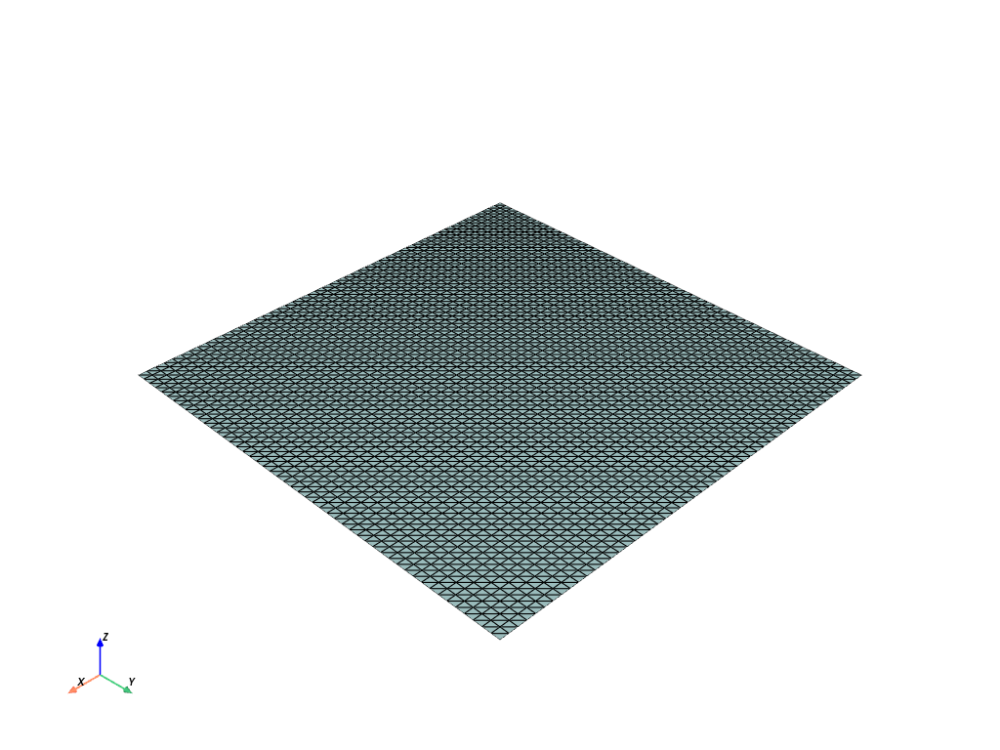

In [ ]:
slab = pv.PolyDataFilters.triangulate(pv.Plane(i_size=50, j_size=50, i_resolution=50, j_resolution=50))
slab.point_data.clear()
slab.plot(show_edges=True)

> (b) Pase la malla ``slab`` a $\texttt{DOLFINx}$ y genere un espacio de funciones de elementos finitos ``V`` adecuado al problema de monodominio. Para ello, revise los atributos ``pyvista.PolyData.points``, ``pyvista.PolyData.faces`` y utilice los métodos ``dolfinx.mesh.create_mesh``, ``dolfinx.fem.functionspace``.

In [ ]:
pts = slab.points
elm = slab.faces.reshape(-1,4)[:,1:] # Arreglo de Mxk (k=3 si los elementos son triangulares)
comm = MPI.COMM_WORLD

c_el = ufl.Mesh(basix.ufl.element("Lagrange", "triangle", 1, shape=(pts.shape[1],))) # Construir elementos por celda

domain = dolfinx.mesh.create_mesh(comm, elm, pts, c_el)

V = dolfinx.fem.functionspace(domain, ("CG", 1))

## **P2**

> **(a)** Programe una función ``AssembleParabolic`` que reciba una función ``sigma`` del tipo ``dolfinx.fem.function.Function``, y retorne la matriz de rigidez ``K`` y matriz de masa ``M`` asociada a la discretización por elementos finitos del modelo de Aliev-Panfilov.

> **(b)** Cree una función ``SolveMonodomain`` que resuelva la ecuación de monodominio para los siguientes inputs:
- ``V`` : Espacio de elementos finitos asociado a un dominio de $\texttt{DOLFINx}$.
- ``sigma`` : Conductividad del tejido.
- ``u0``: Condición inicial $u_0$.
- ``w0``: Condición inicial $w_0$.
- ``u1``: Voltaje de reposo según A-P.
- ``u2``: Voltaje máximo según A-P.
- ``u3``: Umbral de excitación según A-P.
- ``alpha`` : Parámetro $\alpha$ según A-P.
- ``beta``: Parámetro $\beta$ según A-P.
- ``gamma``: Parámetro $\gamma$ según A-P
- ``mu1``: Parámetro $\mu_1$ según A-P
- ``mu2``: Parámetro $\mu_2$ según A-P
- ``stimPos``: Arreglo de puntos de estimulación del tejido de dimensiones ``(Nstim,3)``.
- ``stimRad``: Radio de estimulación.
- ``stimDur``: Duración de estimulación en unidades temporales.
- ``stimMax``: Intensidad del estímulo.
- ``Tstim``: Arreglo de instantes de tiempo a estimular tejido.
- ``dt``: Paso de tiempo.
- ``Tend``: Tiempo final de observación.
- ``step``: Salto de tiempo. Se guardarán en los arreglos ``U``, ``w`` las soluciones donde ``t%step==0``. <br>
<br>**Indicación:** Su función debe retornar un arreglo ``U`` y un arreglo ``W`` de tamaños ``(NT,Nx)`` que contengan respectivamente los arreglos de las soluciones de ``u`` y ``w`` en cada instante de tiempo. Aquí, ``NT==int(np.rint(Tend/dt)+1)`` y ``Nx`` es el número de puntos de la malla.



In [ ]:
def AssembleParabolic(V:dolfinx.fem.function.FunctionSpace,
                      sigma:dolfinx.fem.function.Function):

  u = ufl.TrialFunction(V)  # Trial function
  v = ufl.TestFunction(V)  # Test function

  a1 = sigma * ufl.inner(ufl.grad(u), ufl.grad(v)) * ufl.dx  # Matriz de rigidez
  a2 = ufl.inner(u, v) * ufl.dx  # Matriz de masa

  K, M = fem.petsc.assemble_matrix(fem.form(a1)), fem.petsc.assemble_matrix(fem.form(a2))

  # Ensamblar matrices
  K.assemble()
  M.assemble()

  # Declarar simetría de matrices K y M
  PETSc.Mat.setOption(K,PETSc.Mat.Option.SYMMETRIC,True)
  PETSc.Mat.setOption(K,PETSc.Mat.Option.SYMMETRY_ETERNAL,True)

  PETSc.Mat.setOption(M,PETSc.Mat.Option.SYMMETRIC,True)
  PETSc.Mat.setOption(M,PETSc.Mat.Option.SYMMETRY_ETERNAL,True)

  return K,M

In [ ]:
def SolveMonodomain(V:dolfinx.fem.function.FunctionSpace,
                    sigma:dolfinx.fem.function.Function,
                    u0:np.ndarray = np.zeros(domain.geometry.x.shape[0]),
                    w0:np.ndarray = np.zeros(domain.geometry.x.shape[0]),
                    u1:np.float64 = 0.0,
                    u2:np.float64 = 1.0,
                    u3:np.float64 = 0.15,
                    alpha:np.float64 = 8,
                    beta:np.float64 = 1,
                    gamma:np.float64 = 0.002,
                    mu1:np.float64 = 0.2,
                    mu2:np.float64 = 0.3,
                    stimPos:np.ndarray = np.array([[0.0,0.0,0.0]]),
                    stimRad:np.float64 = 4,
                    stimDur:np.float64 = 1,
                    stimMax:np.float64 = 5,
                    Tstim:np.ndarray = np.array([50*i for i in range(10)]),
                    dt:np.float64 = 0.01,
                    Tend:np.float64 = 500,
                    step:np.int32 = 50):

  K,M= AssembleParabolic(V,sigma)

  A =  M + K * dt # Matriz de problema de elementos finitos

  u = A.createVecRight() # Vector para solución uh
  w = A.createVecRight() # Vector para solución wh
  fstim = A.createVecRight() # Vector para componente de estimulación
  ion=lambda um,wm:alpha*(um-u1)*(um-u2)*(um-u3)+beta*um*wm
  wdot= lambda um,wm: -((wm*mu1)/(um+mu2)+gamma)*(wm+alpha*um*(um-u3-1))

  for s in stimPos:
    #fstim.array[:]+=(np.linalg.norm(pts-s,axis=1)<stimRad).astype(float)
    fstim.array[:]+=(np.linalg.norm(domain.geometry.x - s,axis=1)<stimRad).astype(float)

  # Inicializar solver
  ksp = PETSc.KSP().create()
  ksp.setOperators(A)
  ksp.setType("cg")
  ksp.setConvergenceHistory()
  ksp.getPC().setType("hypre")

  u.array[:] = u0 # Con esto se accede a los valores de u como arreglo.
  w.array[:] = w0
  U=[u.copy().array]
  W=[w.copy().array]

  for i in range(1,int(Tend/dt)+1):
    t=dt*i
    w=w+dt*wdot(u,w)
    #if np.logical_and((Tstim>=t).any(), (Tstim+stimDur<=t).any()):
    if np.any(np.logical_and(t>=Tstim, t<=Tstim+stimDur)):
      stim=stimMax*fstim
    else:
      stim=0*fstim
    b=M*(u-(ion(u,w)-stim)*dt)
    ksp.solve(b, u)
    if i%step==0:
        U.append(u.copy().array)
        W.append(w.copy().array)
  return(U,W)

## **P3**

> Resuelva la ecuación de monodominio para los siguientes inputs:<br> ``sigma = 0.5``<br>
``u0 = np.zeros(domain.geometry.x.shape[0])``<br>
``w0 = np.zeros(domain.geometry.x.shape[0])``<br>
``u1 = 0.0``<br>
``u2 = 1.0``<br>
``u3 = 0.15``<br>
``alpha = 8``<br>
``beta = 1``<br>
``gamma = 0.002``<br>
``mu1 = 0.2``<br>
``mu2 = 0.3``<br>
``stimPos = np.array([[0.0,0.0,0.0]])``<br>
``stimRad = 4``<br>
``stimDur = 1``<br>
``stimMax = 5``<br>
``Tstim = np.array([0.0])``<br>
``dt = 0.05`` <br>
``Tend = 100`` <br>
``step = 50``<br>
**Indicación:** Genere una animación para el voltaje resultante $u_h$ en la malla y otra animación para la variable iónica $w_h$.

In [ ]:
sigma_function = fem.Function(V)  # Crear una función en el espacio V
sigma_function.interpolate(lambda x: 0.5 + 0*x[0])  # Asignar el valor de 0.5 a sigma
U1,V1=SolveMonodomain(V,Tstim=np.array([0.0]), sigma=0.5,dt=0.05,Tend=100)

In [ ]:
"""
NO MODIFICAR: función para generar GIFs
"""
def pv_gif(domain:dolfinx.mesh.Mesh = domain,
           field:np.ndarray = U1,
           field_name:str = "voltage"):

  pyvista_cells, cell_types, x = plot.vtk_mesh(domain)

  grid = pv.UnstructuredGrid(pyvista_cells, cell_types, x)
  grid[field_name] = field[0]
  grid.set_active_scalars(name = field_name)

  plotter = pv.Plotter(notebook=False, off_screen=True)
  plotter.add_mesh(grid,
                   lighting=False,
                   show_edges=True,
                   clim=[0, 1],
                   scalar_bar_args={"title": field_name + "[-]"})

  plotter.open_gif("{}.gif".format(field_name))
  plotter.view_xy()

  nframes = len(field)
  print("number of frames: {}".format(nframes))
  for i in range(1, nframes):
    grid[field_name] = field[i]
    plotter.write_frame()

  plotter.close()

In [ ]:
# Esto va a guardar un gif con nombre voltage.gif
pv_gif(domain, U1, field_name = "voltage")

number of frames: 41


In [ ]:
# Esto es para mostrar el gif
display(Image(filename = "voltage.gif", width = 400))

Output hidden; open in https://colab.research.google.com to view.

## **P4**
Bajo el supuesto de conductividad uniforme $\sigma(\mathbf{x})=\sigma$ y considerando la propagación de un pulso aislado, es posible calcular la velocidad de conducción del tejido a partir de un par cualquiera de puntos $\mathbf{x}_1,\mathbf{x}_2\in\Omega$ (lo suficientemente lejos de la fuente de propagación) como

$$ \textbf{CV}_\sigma:=||\mathbf{x}_1 - \mathbf{x}_2||_2/(\tau_1-\tau_0)\text{,}$$

donde $||\cdot||_2$ denota la norma euclideana en $\Omega$ y $\tau_i$ es el tiempo de llegada del frente de onda a $\mathbf{x}_i$.

> **(a)** Solucione la ecuación de mondominio para ``sigma=0.1,0.2,0.3,0.4,...,0.9,1.0`` desde un estado de reposo y la siguiente colección de parámetros:<br>
``u1 = 0.0``<br>
``u2 = 1.0``<br>
``u3 = 0.15``<br>
``alpha = 8``<br>
``beta = 1``<br>
``gamma = 0.002``<br>
``mu1 = 0.2``<br>
``mu2 = 0.3``<br>
``stimPos = np.array([[0.0,0.0,0.0]])``<br>
``stimRad = 4``<br>
``stimDur = 1``<br>
``stimMax = 5``<br>
``Tstim = np.array([0.0])``<br>
``dt = 0.01`` <br>
``Tend = 100`` <br>
``step = 50``<br>

> **(b)** Grafique los potenciales de acción (tiempo vs. voltaje) de los puntos $\mathbf{x}_1=(0;10)$ y $\mathbf{x}_2=(0;20)$ para ``sigma=0.1,0.2,0.3,0.4,...,0.9,1.0`` y grafique las velocidades de conducción $\mathbf{CV}_\sigma$ asociadas a cada valor de conductividad. Deduzca una relación del tipo $\sigma \propto f(\mathbf{CV}_\sigma)$.

In [ ]:
# Parametros
u1 = 0.0
u2 = 1.0
u3 = 0.15
alpha = 8
beta = 1
gamma = 0.002
mu1 = 0.2
mu2 = 0.3

# Parametros para el estímulo
stimPos = np.array([[0.0,0.0,0.0]])
stimRad = 4
stimDur = 1
stimMax = 5
Tstim = np.array([0.0]) # Pulso singular al inicio

# Parametros temporales
dt = 0.01
Tend = 100
step = 50 # Guardar solución cada 50 pasos de tiempo

# Valores de sigma a probar
sigmas = np.arange(0.1, 1.1, 0.1) # Arreglo de 0.1 a 1.0 con paso de 0.1

# Puntos para calcular la velocidad de conducción
x1_target = np.array([0.0, 10.0, 0.0])
x2_target = np.array([0.0, 20.0, 0.0])

# Encontrar los índices de los puntos de la malla más cercanos a los puntos objetivo
distances_to_x1 = np.linalg.norm(pts - x1_target, axis=1)
idx_x1 = np.argmin(distances_to_x1)

distances_to_x2 = np.linalg.norm(pts - x2_target, axis=1)
idx_x2 = np.argmin(distances_to_x2)

print(f"El punto de la malla más cercano a {x1_target[:2]} es el punto con índice {idx_x1} en las coordenadas {pts[idx_x1]}.")
print(f"El punto de la malla más cercano a {x2_target[:2]} es el punto con índice {idx_x2} en las coordenadas {pts[idx_x2]}.")


El punto de la malla más cercano a [ 0. 10.] es el punto con índice 1810 en las coordenadas [ 0. 10.  0.].
El punto de la malla más cercano a [ 0. 20.] es el punto con índice 2320 en las coordenadas [ 0. 20.  0.].


In [ ]:
# Voltajes
voltages_x1 = []
voltages_x2 = []

# Definir los time-steps
plot_time_steps = np.arange(0, Tend + step * dt, step * dt)

u1 = 0

# Lista para guardar las velocidades de conduccion
CV = []

# Calcular distancia entre x1 y x2
distance_x1_x2 = np.linalg.norm(pts[idx_x1] - pts[idx_x2])

for i in range(len(sigmas)):
    print(f"Simulando para sigma = {sigmas[i]:.1f}")
    U, W = SolveMonodomain(V, sigma=sigmas[i], u1 = u1, u2 = u2, u3 = u3, alpha = alpha,
                           beta = beta, gamma = gamma,mu1 = mu1, mu2 = mu2,
                           stimPos = stimPos, stimRad = stimRad, stimDur = stimDur,
                           stimMax = stimMax, Tstim = Tstim, dt = dt, Tend = Tend,
                           step = step)

    # Obtener el volatje en los puntos cercanos a x1 y x2
    voltage_at_x1 = np.array(U)[:, idx_x1]
    voltage_at_x2 = np.array(U)[:, idx_x2]

    voltages_x1.append(voltage_at_x1)
    voltages_x2.append(voltage_at_x2)

    try:
        #Encontrar peak de voltaje en x1
        peaks_x1, _ = find_peaks(voltage_at_x1, height=0.5)
        arrival_time_x1 = plot_time_steps[peaks_x1[0]]

        #Encontrar peak de voltaje en x2
        peaks_x2, _ = find_peaks(voltage_at_x2, height=0.5)
        arrival_time_x2 = plot_time_steps[peaks_x2[0]]

        # velocidad de conduccion
        conduction_velocity = distance_x1_x2 / (arrival_time_x2 - arrival_time_x1)
        CV.append(conduction_velocity)

    except IndexError:
        # Si no se encuentra un peak)
        print(f"Warning: Could not find a peak for sigma={sigmas[i]:.1f}. Appending NaN to CV.")
        CV.append(np.nan)

Simulando para sigma = 0.1
Simulando para sigma = 0.2
Simulando para sigma = 0.3
Simulando para sigma = 0.4
Simulando para sigma = 0.5
Simulando para sigma = 0.6
Simulando para sigma = 0.7
Simulando para sigma = 0.8
Simulando para sigma = 0.9
Simulando para sigma = 1.0


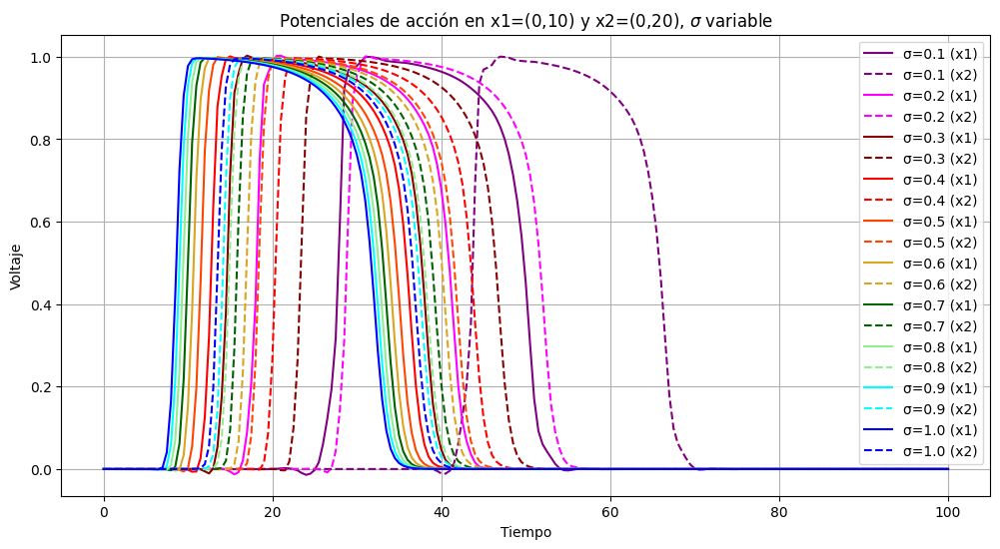

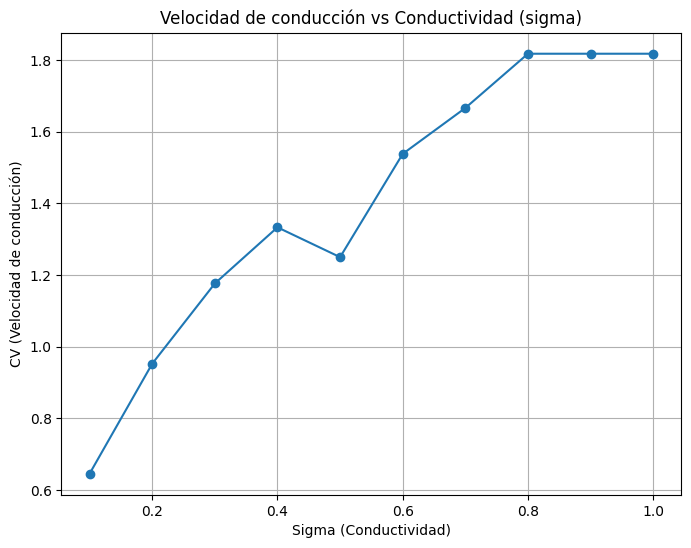

In [ ]:
# Graficar el voltaje
plt.figure(figsize=(12, 6))

colors = ['purple','magenta','darkred','red','orangered','goldenrod','darkgreen','lightgreen','cyan','blue']
for i in range(len(sigmas)):
    plt.plot(plot_time_steps, voltages_x1[i], label=f'σ={sigmas[i]:.1f} (x1)',color = colors[i])
    plt.plot(plot_time_steps, voltages_x2[i], '--', label=f'σ={sigmas[i]:.1f} (x2)', color = colors[i])

plt.xlabel('Tiempo')
plt.ylabel('Voltaje')
plt.title(f'Potenciales de acción en x1=(0,10) y x2=(0,20), $\sigma$ variable')
plt.legend()
plt.grid(True)
plt.show()

# Graficar la velocidad de conduccion
plt.figure(figsize=(8, 6))
valid_sigmas = [sigmas[j] for j in range(len(CV)) if not np.isnan(CV[j])]
valid_CV = [cv for cv in CV if not np.isnan(cv)]
plt.plot(valid_sigmas, valid_CV, 'o-')
plt.xlabel('Sigma (Conductividad)')
plt.ylabel('CV (Velocidad de conducción)')
plt.title('Velocidad de conducción vs Conductividad (sigma)')
plt.grid(True)
plt.show()

Se observa una proporcionalidad aproximadamente logarítmica entre $CV$ y $\sigma$, ignorando la anomalía del $\sigma=0.5$.

# **Parte II**

## **P1**

> Considere la siguiente colección de parámetros para ``SolveMonodomain``:
<br>``sigma = 0.5``
<br>``u1 = 0.0``
<br>``u2 = 1.0``
<br>``u3 = 0.15``
<br>``gamma = 0.002``
<br>``mu1 = 0.2``
<br>``mu2 = 0.3``
<br>``stimPos = np.array([[0.0,0.0,0.0]])``
<br>``stimRad = 4``
<br>``stimDur = 1``
<br>``stimMax = 5``
<br>``dt = 0.01``
<br>``step = 50``

>**(a)** Resuelva la ecuación de monodominio desde un estado de reposo para un pulso singular en el origen, ``alpha=1,2,3,4,5,6,7,8``, ``beta=1`` y ``Tend=200``. En cada caso, grafique voltaje y variable iónica como funciones del tiempo para el punto $\mathbf{x_0}=(0;10)$.

>**(b)** Resuelva la ecuación de monodominio desde un estado de reposo para un pulso singular en el origen, ``beta=1,2,3,4,5,6,7,8``, ``alpha=8`` y ``Tend=50``. En cada caso, grafique voltaje y variable iónica como funciones del tiempo para el punto $\mathbf{x_0}=(0;10)$.

>**(c)** Concluya sobre los roles de $\alpha$ y $\beta$ en la generación de soluciones para el modelo de Aliev-Panfilov.

In [ ]:
# Parametros
sigma = 0.5
u1 = 0.0
u2 = 1.0
u3 = 0.15
gamma = 0.002
mu1 = 0.2
mu2 = 0.3
stimPos = np.array([[0.0,0.0,0.0]])
stimRad = 4
stimDur = 1
stimMax = 5
dt = 0.01
step = 5
Tend = 200

u0 = np.zeros(domain.geometry.x.shape[0])
w0 = np.zeros(domain.geometry.x.shape[0])
beta = 1
Tstim = np.array([0.0]) # Pulso singular en el origen al inicio

# Define el punto objetivo x0=(0;10)
x0_target = np.array([0.0, 10.0, 0.0])

# Encuentra el índice del punto de la malla más cercano a x0_target
distances_to_x0 = np.linalg.norm(pts - x0_target, axis=1)
idx_x0 = np.argmin(distances_to_x0)

print(f"El punto de la malla más cercano a {x0_target[:2]} es el punto con índice {idx_x0} en las coordenadas {pts[idx_x0]}.")


# Iterar sobre los valores de alpha y graficar

#acá guardo los vectores a plotear
voltage_at_x0 = []
ionic_variable_at_x0 = []

for alpha in [1,2,3,4,5,6,7,8]:
  print(f"Simulando con alpha = {alpha}")

  # Resuelve la ecuación de monodominio
  U, W = SolveMonodomain(V, sigma, u0, w0, u1, u2, u3, alpha, beta, gamma, mu1, mu2,
                         stimPos, stimRad, stimDur, stimMax, Tstim, dt, Tend, step)

  # Extrae los valores de voltaje y variable iónica en el punto x0 a lo largo del tiempo
  # los guardo en las listas que usaremos después para los gráficos
  voltage_at_x0.append(np.array(U)[:, idx_x0])
  ionic_variable_at_x0.append(np.array(W)[:, idx_x0])


El punto de la malla más cercano a [ 0. 10.] es el punto con índice 1810 en las coordenadas [ 0. 10.  0.].
Simulando con alpha = 1
Simulando con alpha = 2
Simulando con alpha = 3
Simulando con alpha = 4
Simulando con alpha = 5
Simulando con alpha = 6
Simulando con alpha = 7
Simulando con alpha = 8


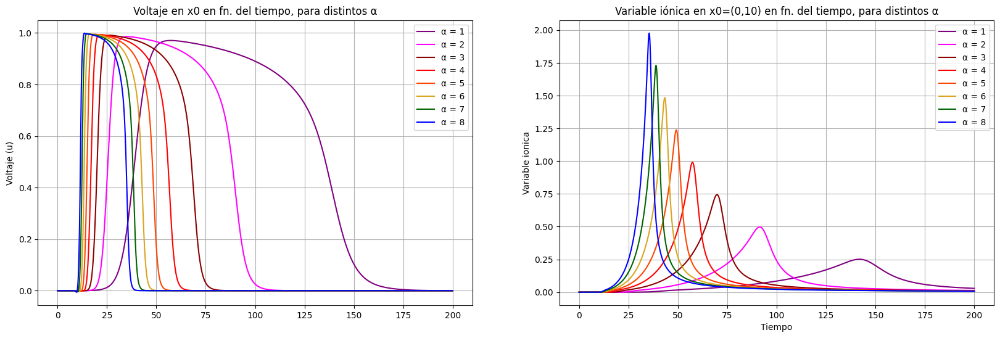

In [ ]:
#Graficar

# Calcula el arreglo de tiempo
num_saved_steps = len(U)
saved_dt = step * dt
time_points = np.arange(0, num_saved_steps * saved_dt, saved_dt)
# Ajuste para incluir Tend si es necesario
if not np.isclose(time_points[-1], Tend) and num_saved_steps * saved_dt >= Tend:
  time_points = np.linspace(0, Tend, num_saved_steps)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6), sharex=True)
colors = ['purple','magenta','darkred','red','orangered','goldenrod','darkgreen','blue']
for i in range(8):
  ax1.plot(time_points, voltage_at_x0[i], color = colors[i], label = f'α = {i+1}')
  ax1.set_ylabel('Voltaje (u)')
  ax1.set_title(f'Voltaje en x0 en fn. del tiempo, para distintos α')
  ax1.grid(True)
  ax1.legend()

  ax2.plot(time_points, ionic_variable_at_x0[i], color=colors[i], label = f'α = {i+1}')
  ax2.set_ylabel('Variable Iónica (w)')
  ax2.set_xlabel('Tiempo')
  ax2.grid(True)
  ax2.legend()

plt.xlabel('Tiempo')
plt.ylabel('Variable ionica')
plt.title(f'Variable iónica en x0=(0,10) en fn. del tiempo, para distintos α')
plt.legend()
plt.show()


In [ ]:
u0 = np.zeros(domain.geometry.x.shape[0])
w0 = np.zeros(domain.geometry.x.shape[0])
alpha = 8
Tend = 50

# Iterar sobre los valores de alpha y graficar
#reiniciar los vectores para el plot
voltage_at_x0 = []
ionic_variable_at_x0 = []
for beta in [1,2,3,4,5,6,7,8]:
  Tstim = np.array([0.0])
  U,W = SolveMonodomain(V, sigma, u0, w0, u1, u2, u3, alpha, beta, gamma, mu1, mu2, stimPos, stimRad, stimDur, stimMax, Tstim, dt, Tend, step)

  #guardo
  voltage_at_x0.append(np.array(U)[:, idx_x0])
  ionic_variable_at_x0.append(np.array(W)[:, idx_x0])

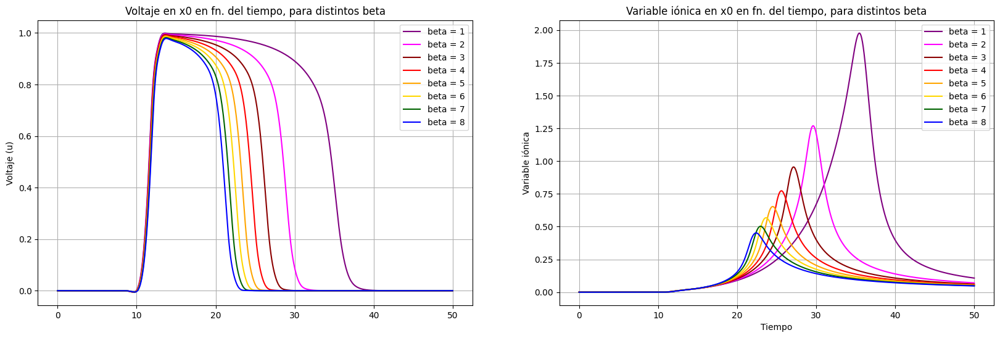

In [ ]:
#Graficar

# Calcula el arreglo de tiempo
num_saved_steps = len(U)
saved_dt = step * dt
time_points = np.arange(0, num_saved_steps * saved_dt, saved_dt)
# Ajuste para incluir Tend si es necesario
if not np.isclose(time_points[-1], Tend) and num_saved_steps * saved_dt >= Tend:
  time_points = np.linspace(0, Tend, num_saved_steps)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6), sharex=True)
colors = ['purple','magenta','darkred','red','orange','gold','darkgreen','blue']
for i in range(8):
  ax1.plot(time_points, voltage_at_x0[i], color = colors[i], label = f'beta = {i+1}')
  ax1.set_ylabel('Voltaje (u)')
  ax1.set_title(f'Voltaje en x0 en fn. del tiempo, para distintos beta')
  ax1.grid(True)
  ax1.legend()

  ax2.plot(time_points, ionic_variable_at_x0[i], color=colors[i], label = f'beta = {i+1}')
  ax2.set_ylabel('Variable Iónica (w)')
  ax2.set_xlabel('Tiempo')
  ax2.grid(True)
  ax2.legend()

plt.xlabel('Tiempo')
plt.ylabel('Variable iónica')
plt.title(f'Variable iónica en x0 en fn. del tiempo, para distintos beta')
plt.legend()
plt.show()

**Conclusión:** Los parámetros $\alpha$ y $\beta$ parecen modifican la duración de la activación del tejido (en el sentido de la duración del voltaje alto) luego del estímulo. Mientras más altos sean, más corto será el periodo de activación luego del estímulo.

La diferencia entre los parámetros está en cómo modifican la variable iónica: Los alphas altos adelantan su peak, mientras que los betas altos lo retrasan.

## **P2**

> Usando ``SolveMonodomain`` resuelva la ecuación de monodominio desde un estado de reposo hasta un tiempo ``Tend = 500`` para un tren de estímulos ``Tstim=[50*i for i in range(10)]`` y la siguiente colección adicional de parámetros: <br> ``sigma = 0.4 ``
<br>``u1 = 0.0``
<br>``u2 = 1.0``
<br>``u3 = 0.15``
<br>``alpha = 8``
<br>``beta = 1``
<br>``gamma = 0.002``
<br>``mu1 = 0.2``
<br>``mu2 = 0.3``
<br>``stimPos = np.array([[0.0,0.0,0.0]])``
<br>``stimRad = 4``
<br>``stimDur = 1``
<br>``stimMax = 5``
<br>``dt = 0.01``
<br>``step = 50``

**Indicación:** Grafique la diferencia de voltaje desde una referencia $\mathbf{x}_0$ y la variable iónica como funciones del tiempo para 10 puntos de muestra. Para obtener la diferencia de voltaje, considere un punto fijo $\mathbf{x}_0$ y calcule $u_{\mathbf{x}_0}(\mathbf{x}):=u(\mathbf{x})-u(\mathbf{x}_0)$.

In [ ]:
x_target=[]
'''for k in [5*i for i in range(10)]:
  x_target.append(np.array([0.0, k, 0.0]))
'''
for i in range(3):
  for j in range(4):
    x_target.append(np.array([15*i,15*j,0.0]))
x_target = x_target[2:]
print(x_target)

# Encontrar los índices de los puntos de la malla más cercanos a los puntos objetivo
puntos_malla=[]
for i in range(len(x_target)):
  puntos = np.linalg.norm(pts - x_target[i], axis=1)
  idx = np.argmin(puntos)
  puntos_malla.append(idx)
ptos_muestra=np.array(puntos_malla)

# Define el punto objetivo x0=(0;10)
x0_target = np.array([0.0, 10.0, 0.0])

# Encuentra el índice del punto de la malla más cercano a x0_target
distances_to_x0 = np.linalg.norm(pts - x0_target, axis=1)
idx_x0 = np.argmin(distances_to_x0)

[array([ 0., 30.,  0.]), array([ 0., 45.,  0.]), array([15.,  0.,  0.]), array([15., 15.,  0.]), array([15., 30.,  0.]), array([15., 45.,  0.]), array([30.,  0.,  0.]), array([30., 15.,  0.]), array([30., 30.,  0.]), array([30., 45.,  0.])]


In [ ]:
# Parametros
sigma = 0.4
u1 = 0.0
u2 = 1.0
u3 = 0.15
gamma = 0.002
mu1 = 0.2
mu2 = 0.3
stimPos = np.array([[0.0,0.0,0.0]])
stimRad = 4
stimDur = 1
stimMax = 5
dt = 0.01
step = 50

u0 = np.zeros(domain.geometry.x.shape[0])
w0 = np.zeros(domain.geometry.x.shape[0])
alpha = 8
beta = 1
Tend = 500


Tstim = np.array([50*i for i in range(10)])

U, W = SolveMonodomain(V, sigma, u0, w0, u1, u2, u3, alpha, beta, gamma,
                         mu1, mu2, stimPos, stimRad, stimDur, stimMax,
                         Tstim, dt, Tend, step)

voltage_at_x0 = np.array(U)[:, idx_x0]
ionic_variable_at_x0 = np.array(W)[:, idx_x0]

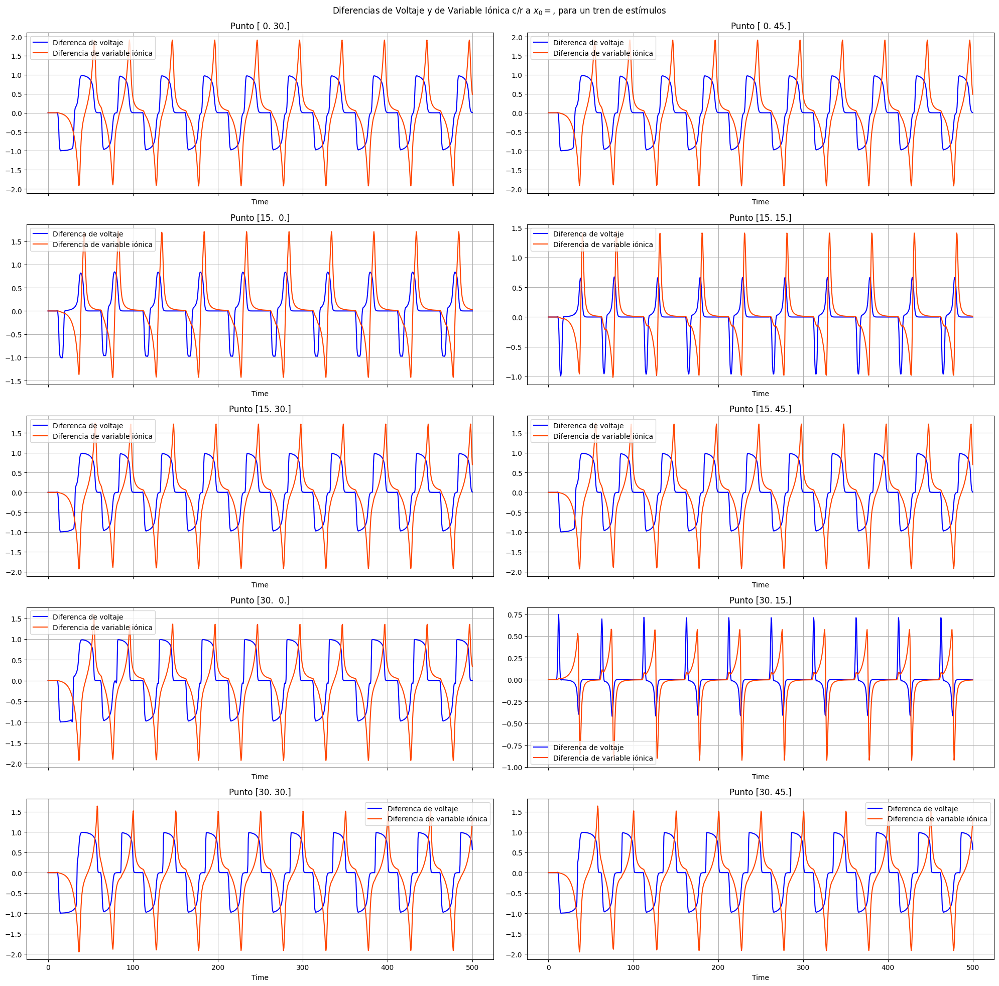

In [ ]:
diferencia_voltaje=[]
diferencia_ionica=[]
for x in ptos_muestra:
  voltage = np.array(U)[:, x]
  ionic_variable= np.array(W)[:, x]
  diferencia_voltaje.append(voltage - voltage_at_x0)
  diferencia_ionica.append(ionic_variable - ionic_variable_at_x0)

# Calcula el arreglo de tiempo
num_saved_steps = len(U)
saved_dt = step * dt
time_points = np.arange(0, num_saved_steps * saved_dt, saved_dt)
# Ajuste para incluir Tend si es necesario
if not np.isclose(time_points[-1], Tend) and num_saved_steps * saved_dt >= Tend:
     time_points = np.linspace(0, Tend, num_saved_steps)


# Crear una figura y ejes para los gráficos
fig, axs = plt.subplots(5, 2, figsize=(20, 20), sharex=True)

# Plotting the voltage time series for each sigma
for i in range(5):
  for j in range(2):
    axs[i][j].plot(time_points, diferencia_voltaje[2*i+j], label='Diferenca de voltaje', color='blue')
    axs[i][j].plot(time_points, diferencia_ionica[2*i+j],  label='Diferencia de variable iónica', color='orangered')
    axs[i][j].set_xlabel('Time')
    axs[i][j].legend()
    axs[i][j].grid(True)
    axs[i][j].set_title(f'Punto {x_target[2*i+j][:2]}')

fig.suptitle(f'Diferencias de Voltaje y de Variable Iónica c/r a $x_0=$, para un tren de estímulos\n')
# Ajustar el diseño para evitar solapamiento
plt.tight_layout()
plt.show()

# **P3**

Los episodios de fibrilación auricular tienden a ser caracterizados por mecanismos de reentrada auto-sostenidos en el dominio cardíaco. Estas reentradas son descritas como frentes estables de voltaje con forma de espiral.

> **(a)** Simule un espiral con el modelo de monodominio. Para ello, considere los siguientes inputs para ``SolveMonodomain``:                    <br>``sigma=0.4``
<br>``u0 = np.zeros(domain.geometry.x.shape[0])``
<br>``w0 = (domain.geometry.x[:,0].max() - domain.geometry.x[:,0])/(domain.geometry.x[:,0].max() - domain.geometry.x[:,0].min())*0.5``
<br>``u1 = 0.0``
<br>``u2 = 1.0``
<br>``u3 = 0.15``
<br>``alpha = 8``
<br>``beta = 1``
<br>``gamma = 0.002``
<br>``mu1 = 0.2``
<br>``mu2 = 0.3``
<br>``stimPos = np.array([[-20,-25,0],[-15,-25,0.],[-10,-25,0.],[-5,-25,0],[0,-25,0],[5,-25,0],[10,-25,0],[15,-25,0],[20,-25,0]])``
<br>``stimRad = 4``
<br>``stimDur = 3``
<br>``stimMax = 5``
<br>``Tstim = np.array([0.0])``
<br>``dt = 0.05``
<br>``Tend = 500``
<br>``step = 50``
<br> **Indicación:** Genere un .gif para los últimos 50 estados de tiempo de la simulación.

> **(b)** Utilice la configuración anterior de parámetros, pero empleando como condición inicial los resultados de la simulación anterior, ``stimPos = np.array([[0.0,0.0,0.0]])`` y ``Tsim=[50*i for i in range(10)]``.
<br> **Indicación:** Genere un .gif para los últimos 50 estados de tiempo de la simulación.

>**(c)** Genere los mismos gráficos de la P2 para el mismo muestreo de 10 puntos y el mismo punto de referencia. Compare con los electrogramas previamente obtenidos y comente.






Simulando el espiral...
Generando GIF para los últimos 50 estados de la simulación del espiral...
number of frames: 50


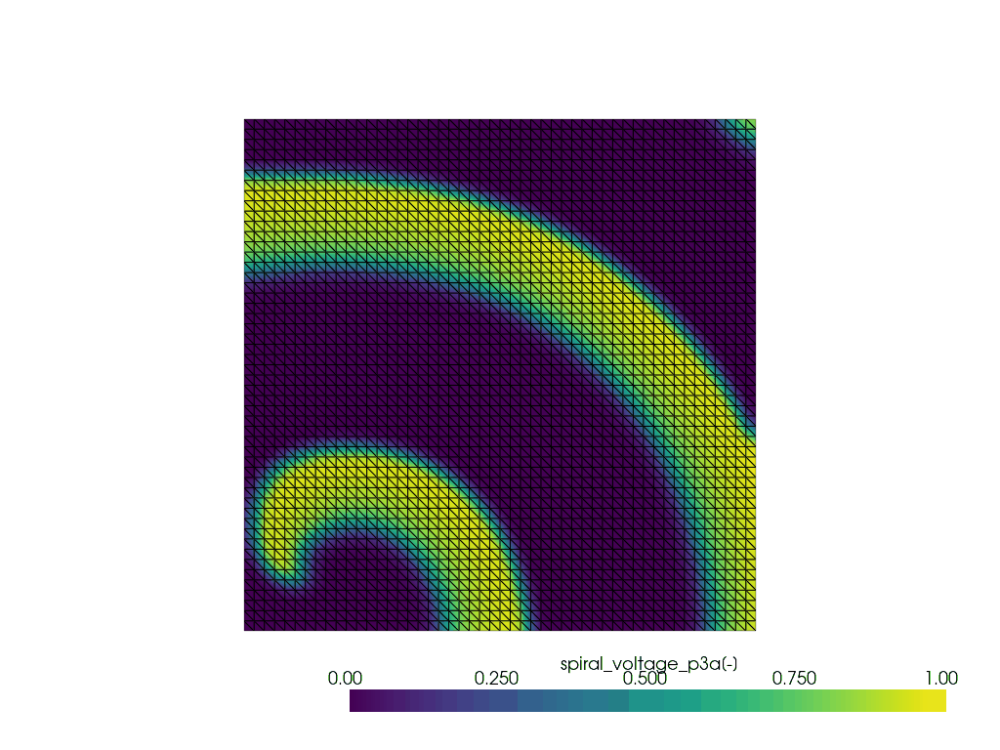

Simulación (Part II, P3a) completada.


In [ ]:
# Parámetros
sigma_spiral = 0.4
u0_spiral = np.zeros(domain.geometry.x.shape[0])
w0_spiral = (domain.geometry.x[:,0].max() - domain.geometry.x[:,0])/(domain.geometry.x[:,0].max() - domain.geometry.x[:,0].min())*0.5
u1_spiral = 0.0
u2_spiral = 1.0
u3_spiral = 0.15
alpha_spiral = 8
beta_spiral = 1
gamma_spiral = 0.002
mu1_spiral = 0.2
mu2_spiral = 0.3
stimPos_spiral = np.array([[-20,-25,0],[-15,-25,0.],[-10,-25,0.],[-5,-25,0],[0,-25,0],[5,-25,0],[10,-25,0],[15,-25,0],[20,-25,0]])
stimRad_spiral = 4
stimDur_spiral = 3
stimMax_spiral = 5
Tstim_spiral = np.array([0.0])
dt_spiral = 0.05
Tend_spiral = 500
step_spiral = 50

print("Simulando el espiral...")
U_spiral, W_spiral = SolveMonodomain(
    V,
    sigma=sigma_spiral,
    u0=u0_spiral,
    w0=w0_spiral,
    u1=u1_spiral,
    u2=u2_spiral,
    u3=u3_spiral,
    alpha=alpha_spiral,
    beta=beta_spiral,
    gamma=gamma_spiral,
    mu1=mu1_spiral,
    mu2=mu2_spiral,
    stimPos=stimPos_spiral,
    stimRad=stimRad_spiral,
    stimDur=stimDur_spiral,
    stimMax=stimMax_spiral,
    Tstim=Tstim_spiral,
    dt=dt_spiral,
    Tend=Tend_spiral,
    step=step_spiral
)

# Generate GIF for the last 50 saved states (Part II, P3a)
num_frames_gif = 50
if len(U_spiral) > num_frames_gif:
    U_spiral_gif = U_spiral[-num_frames_gif:]
else:
    U_spiral_gif = U_spiral

print(f"Generando GIF para los últimos {len(U_spiral_gif)} estados de la simulación del espiral...")
pv_gif(domain, U_spiral_gif, field_name="spiral_voltage_p3a")
display(Image(filename="spiral_voltage_p3a.gif", width=400))

print("Simulación (Part II, P3a) completada.")

Simulando el espiral...
Generando GIF para los últimos 50 estados de la simulación del espiral...
number of frames: 50


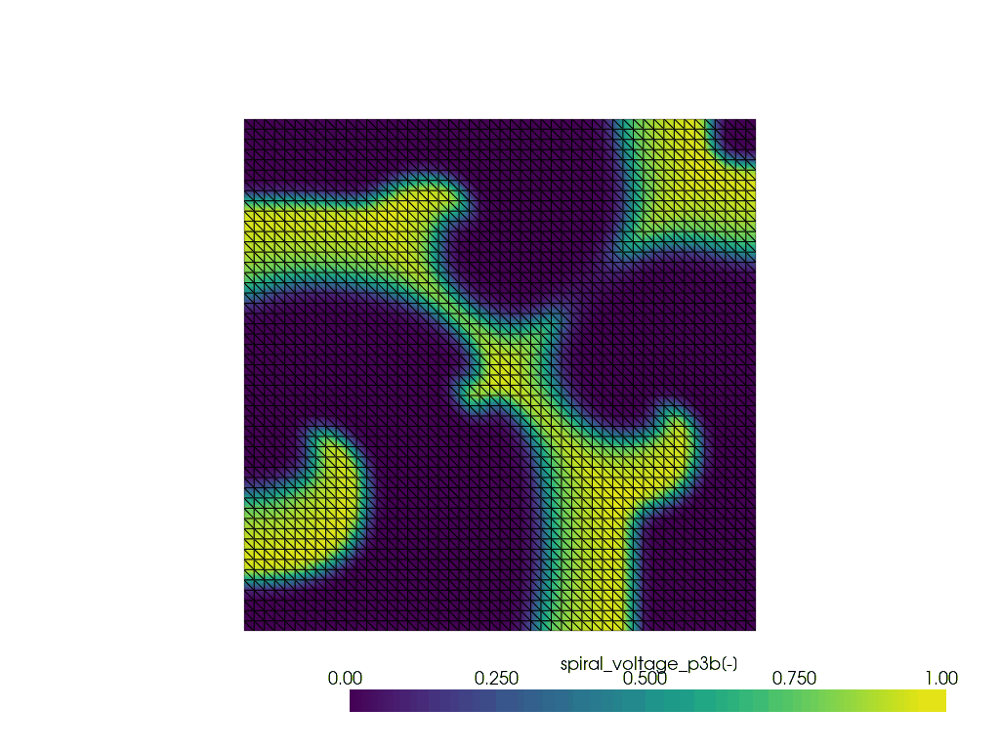

Simulación (Parte II, P3b) completada.


In [ ]:
# Parámetros
u0_p3b = U_spiral[-1]
w0_p3b = W_spiral[-1]
sigma_p3b = 0.4
u1_p3b = 0.0
u2_p3b = 1.0
u3_p3b = 0.15
alpha_p3b = 8
beta_p3b = 1
gamma_p3b = 0.002
mu1_p3b = 0.2
mu2_p3b = 0.3
stimPos_p3b = np.array([[0.0,0.0,0.0]])
stimRad_p3b = 4
stimDur_p3b = 1
stimMax_p3b = 5
Tstim_p3b = np.array([50*i for i in range(10)])
dt_p3b = 0.05
Tend_p3b = 500
step_p3b = 50

print("Simulando el espiral...")
# Simular con los nuevos parametros y condicion inicial
U_p3b, W_p3b = SolveMonodomain(
    V,
    sigma=sigma_p3b,
    u0=u0_p3b,
    w0=w0_p3b,
    u1=u1_p3b,
    u2=u2_p3b,
    u3=u3_p3b,
    alpha=alpha_p3b,
    beta=beta_p3b,
    gamma=gamma_p3b,
    mu1=mu1_p3b,
    mu2=mu2_p3b,
    stimPos=stimPos_p3b,
    stimRad=stimRad_p3b,
    stimDur=stimDur_p3b,
    stimMax=stimMax_p3b,
    Tstim=Tstim_p3b,
    dt=dt_p3b,
    Tend=Tend_p3b,
    step=step_p3b
)

# Generae el gif
num_frames_gif = 50
if len(U_p3b) > num_frames_gif:
    U_p3b_gif = U_p3b[-num_frames_gif:]
else:
    U_p3b_gif = U_p3b

print(f"Generando GIF para los últimos {len(U_p3b_gif)} estados de la simulación del espiral...")
pv_gif(domain, U_p3b_gif, field_name="spiral_voltage_p3b")
display(Image(filename="spiral_voltage_p3b.gif", width=400))

print("Simulación (Parte II, P3b) completada.")

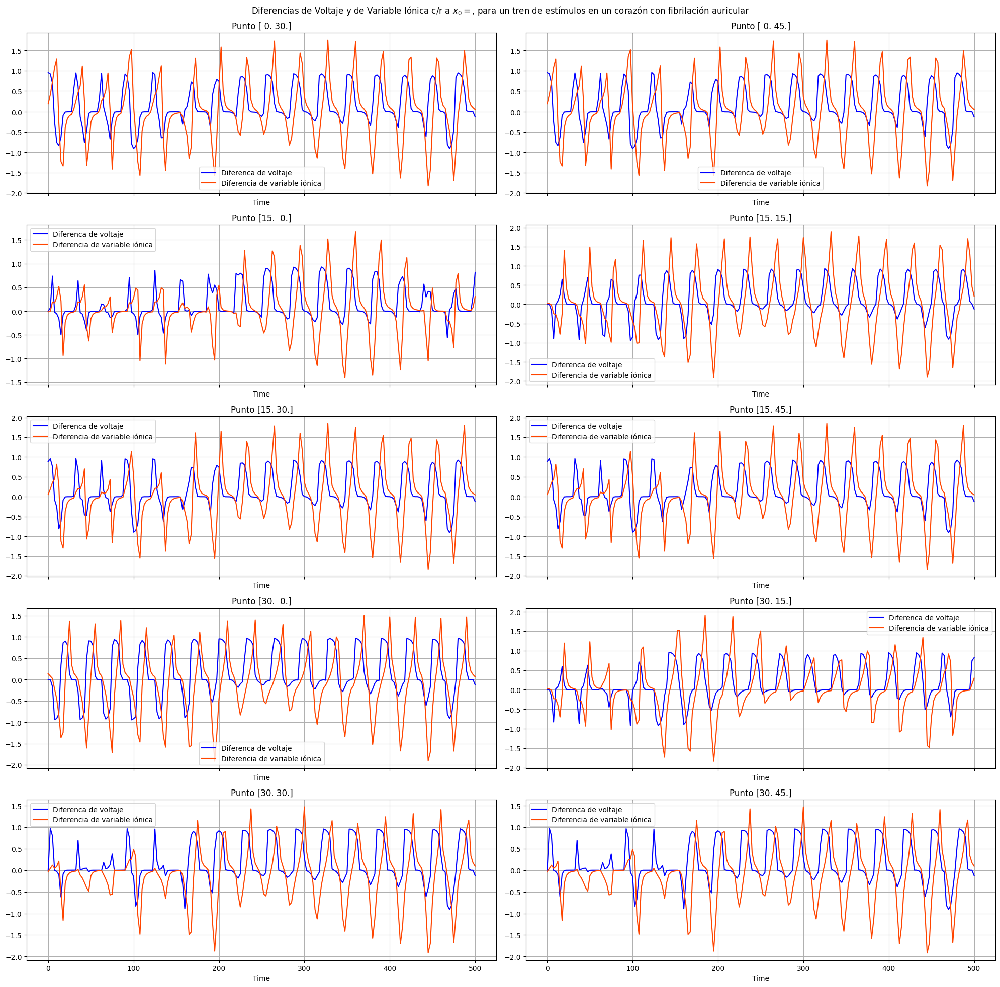

In [ ]:
# Crear una figura y ejes para los gráficos
fig, axs = plt.subplots(5, 2, figsize=(20, 20), sharex=True)

x_target_p3c = x_target
ptos_muestra_p3c = ptos_muestra

voltage_at_x0 = np.array(U_p3b)[:, idx_x0]
ionic_variable_at_x0 = np.array(W_p3b)[:, idx_x0]

diferencia_voltaje_p3c=[]
diferencia_ionica_p3c=[]

for x in ptos_muestra:
  voltage = np.array(U_p3b)[:, x]
  ionic_variable= np.array(W_p3b)[:, x]
  diferencia_voltaje_p3c.append(voltage - voltage_at_x0)
  diferencia_ionica_p3c.append(ionic_variable - ionic_variable_at_x0)

# Calcular los time points
num_saved_steps_p3c = len(U_p3b)
saved_dt_p3c = step_p3b * dt_p3b
time_points_p3c = np.arange(0, num_saved_steps_p3c * saved_dt_p3c, saved_dt_p3c)

for i in range(5):
  for j in range(2):
    axs[i][j].plot(time_points_p3c, diferencia_voltaje_p3c[2*i+j], label='Diferenca de voltaje', color='blue')
    axs[i][j].plot(time_points_p3c, diferencia_ionica_p3c[2*i+j],  label='Diferencia de variable iónica', color='orangered')
    axs[i][j].set_xlabel('Time')
    axs[i][j].legend()
    axs[i][j].grid(True)
    axs[i][j].set_title(f'Punto {x_target[2*i+j][:2]}')

fig.suptitle(f'Diferencias de Voltaje y de Variable Iónica c/r a $x_0=$, para un tren de estímulos en un corazón con fibrilación auricular\n')
# Ajustar el diseño para evitar solapamiento
plt.tight_layout()
plt.show()

En la P2, partíamos desde reposo y veíamos peaks claros cada vez que llegaba un estímulo, lo que mostraba bien cómo se propagaban los potenciales de acción.

Por otro lado, en la P3c la cosa cambia, ya que partimos desde una onda en espiral. Aunque seguimos aplicando estímulos, la dinámica está dominada por esa espiral, así que el comportamiento es mucho más complejo.

Lo que se ve en los electrogramas ya no son peaks marcados por cada estímulo, sino más bien fluctuaciones continuas y algo irregulares, que dependen de cómo va girando la espiral y por dónde pasa. La señal varía dependiendo de qué tan cerca esté el punto de muestreo del centro o de los brazos de la espiral.

Esto muestra cómo una espiral puede mantener actividad eléctrica complicada y caótica por sí sola, algo típico de estados como la fibrilación, y cómo los estímulos externos pasan a ser secundarios una vez que se forma esta espiral.

